**Research question: Does exposure to green spaces and tree canopies have an effect on particulate matter levels 2.5 in the city of Los Angeles**?

In [9]:
# First we are looking at the cal enviro screen data to start visualizing and mapping Particulate Matter (PM) levels in Los Angeles

In [1]:
# importing the pandas library to analyze our data
import pandas as pd

In [4]:
# defining and importing our data onto the notebook
# for this project, we are looking at the CalEnviroScreen 3.0 and the Healthy Places Index
# we are also adding another databas to add neighborhood names to our data
CES = pd.read_csv('Data/ces3results.csv')
HPI = pd.read_csv('Data/HPI_LA.csv')
census = pd.read_csv('Data/Census_Tracts_2010_Population.csv')
census2 = pd.read_csv('Data/Censust_neighborhood.csv')

In [5]:
# first we will look at the CalEnviroScreen dataset
# here we are checking if there is a 0 in front of the census tracts
# we see there is no 0 in front of it so we will go ahead and add a 0 
CES.CensusTract.head()

0    6019001100
1    6071001600
2    6019000200
3    6077000801
4    6019001500
Name: CensusTract, dtype: int64

In [7]:
# we will redefine data type for census tract as a string variable so that it can include 0
# once we check the data, we see that there is a 0 now
CES = pd.read_csv(
    'Data/ces3results.csv',
    dtype=
    {
        'CensusTract':str,
    }
)
CES.head()

,CensusTract,TotalPopulation,CaliforniaCounty,ZIP,NearbyCity_(to help approximate location only),Longitude,Latitude,CES3.0_Score,CES3.0_pctl,CES3.0_pctl_range,...,LinguisticIsolation_pctl,Poverty,Poverty_pctl,Unemployment,Unemployment_pctl,HousingBurden,HousingBurden_pctl,PopChar,PopChar_Score,PopChar_pctl
0,06019001100,3174,Fresno,93706,Fresno,-119.781696,36.709695,94.09,100.00,95-100% (highest scores),...,77.51,76.3,97.12,17.6,91.72,26.0,79.40,92.12,9.55,99.70
1,06071001600,6133,San Bernardino,91761,Ontario,-117.618013,34.057780,90.68,99.99,95-100% (highest scores),...,96.25,72.5,94.63,12.3,71.82,34.1,93.75,87.44,9.07,98.11
2,06019000200,3167,Fresno,93706,Fresno,-119.805504,36.735491,85.97,99.97,95-100% (highest scores),...,78.39,86.8,99.56,16.1,87.98,40.1,97.85,94.58,9.81,99.99
3,06077000801,6692,San Joaquin,95203,Stockton,-121.314524,37.940517,82.49,99.96,95-100% (highest scores),...,75.14,61.3,85.57,19.6,94.97,21.1,63.54,86.70,8.99,97.72
4,06019001500,2206,Fresno,93725,Fresno,-119.717843,36.681600,82.03,99.95,95-100% (highest scores),...,73.72,66.4,90.23,18.6,93.65,28.1,83.98,80.08,8.30,92.76


# Cleaning data

In [8]:
# now, we will trim our dataset to include variables that we are interested in seeing
# for this dataset, we will look at PM2.5 
# we are also renaming our columns and checking to see if our data is now trimmed and renamed
CES = CES[['CensusTract','TotalPopulation', 'Longitude','Latitude', 'PM2.5']]
CES.columns = ['FIPS', 'Total_Pop', 'Longitude', 'Latitude', 'PM25']
CES.head()

,FIPS,Total_Pop,Longitude,Latitude,PM25
0,06019001100,3174,-119.781696,36.709695,15.40
1,06071001600,6133,-117.618013,34.057780,13.31
2,06019000200,3167,-119.805504,36.735491,15.40
3,06077000801,6692,-121.314524,37.940517,12.54
4,06019001500,2206,-119.717843,36.681600,15.40


In [10]:
# now, we are adding census tract with neighborhood names 
# we will merge this dataset with the census data to have only LA city census tracts
# first we will check if the census tracts have a 0 and they do not
census.Tract.head()

0    6037101110
1    6037101122
2    6037101210
3    6037101220
4    6037101300
Name: Tract, dtype: int64

In [11]:
#we will redefine data type for census tract as a string variable so that it can include 0
census = pd.read_csv(
    'Data/Census_Tracts_2010_Population.csv',
    dtype=
    {
        'Tract':str,
    }
)
census.head()

,OBJECTID,Tract,TRACTCE10,POP,LATPOP_D,WHIPOP_D,BLAPOP_D,AMIPOP_D,ASIPOP_D,HPIPOP_D,...,AMIVAP_D,ASIVAP_D,HPIVAP_D,OTHVAP_D,MMRVAP_D,H0010001,H0010002,H0010003,TOOLTIP,NLA_URL
0,1,06037101110,101110,4731,1324,2656,83,24,580,15,...,22,466,14,27,9,1734,1641,93,Tract: 1011.10\nTotal Population: 4731,navigatela/reports/census_tracts_2010.cfm?PK=1...
1,2,06037101122,101122,3664,575,2437,34,18,578,3,...,17,481,2,10,7,1369,1325,44,Tract: 1011.22\nTotal Population: 3664,navigatela/reports/census_tracts_2010.cfm?PK=1...
2,3,06037101210,101210,5990,2219,2890,192,16,625,16,...,15,537,13,11,12,2317,2150,167,Tract: 1012.10\nTotal Population: 5990,navigatela/reports/census_tracts_2010.cfm?PK=1...
3,4,06037101220,101220,3363,1272,1662,45,25,335,6,...,21,270,6,4,7,1317,1246,71,Tract: 1012.20\nTotal Population: 3363,navigatela/reports/census_tracts_2010.cfm?PK=1...
4,5,06037101300,101300,4199,503,3190,47,26,402,10,...,20,329,9,9,8,1582,1542,40,Tract: 1013.00\nTotal Population: 4199,navigatela/reports/census_tracts_2010.cfm?PK=1...


In [12]:
# here we are renaming our column and then checking to see if they were renamed
census = census[['Tract']]
census.columns = ['FIPS']
census.head()

,FIPS
0,06037101110
1,06037101122
2,06037101210
3,06037101220
4,06037101300


In [13]:
#now that both CES and census tracts are ready, we will merge them and match them using the 'FIPS' column/code in each database
#calling the merged dataset 'PM25'
PM_25 = census.merge(CES,on="FIPS")
PM_25.head()

,FIPS,Total_Pop,Longitude,Latitude,PM25
0,06037101110,4731,-118.292987,34.259474,11.21
1,06037101122,3664,-118.290147,34.267721,11.21
2,06037101210,5990,-118.290731,34.252972,11.21
3,06037101220,3363,-118.281632,34.251609,11.21
4,06037101300,4199,-118.270999,34.248778,11.21


In [14]:
# now we will add neighborhood names to this 
# first we will check the census tract column
census2.CensusTract.head()

0    6037101110
1    6037101122
2    6037101210
3    6037101220
4    6037101300
Name: CensusTract, dtype: int64

In [15]:
#we will redefine data type for census tract as a string variable so that it can include 0
census2 = pd.read_csv(
    'Data/Censust_neighborhood.csv',
    dtype=
    {
        'CensusTract':str,
    }
)
census2.head()

,GEOID,Tract,CensusTract,Tract Number,Neighborhood,Location,Latitude,Longitude
0,1400000US06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",06037101110,101110,Tujunga,"(34.2595555, -118.293602)",34.259555,-118.293602
1,1400000US06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",06037101122,101122,Tujunga,"(34.267357, -118.29024)",34.267357,-118.290240
2,1400000US06037101210,"Census Tract 1012.10, Los Angeles County, Cali...",06037101210,101210,Tujunga,"(34.251998, -118.2926875)",34.251998,-118.292687
3,1400000US06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",06037101220,101220,Tujunga,"(34.2511895, -118.281014)",34.251190,-118.281014
4,1400000US06037101300,"Census Tract 1013, Los Angeles County, California",06037101300,101300,Tujunga,"(34.2455945, -118.271731)",34.245595,-118.271731


In [16]:
# here we are trimming and renaming our column then checking to see if they were renamed
census2 = census2[['GEOID','Tract','CensusTract','Neighborhood','Location']]
census2.columns = ['GEOID','CensusTract','FIPS','Neighborhood','Location']
census2.head()

,GEOID,CensusTract,FIPS,Neighborhood,Location
0,1400000US06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",06037101110,Tujunga,"(34.2595555, -118.293602)"
1,1400000US06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",06037101122,Tujunga,"(34.267357, -118.29024)"
2,1400000US06037101210,"Census Tract 1012.10, Los Angeles County, Cali...",06037101210,Tujunga,"(34.251998, -118.2926875)"
3,1400000US06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",06037101220,Tujunga,"(34.2511895, -118.281014)"
4,1400000US06037101300,"Census Tract 1013, Los Angeles County, California",06037101300,Tujunga,"(34.2455945, -118.271731)"


In [17]:
#now that both CES and census tracts are ready, we will merge them and match them using the 'FIPS' column/code in each database
#calling the merged dataset 'PM25'
PM25 = census2.merge(PM_25,on="FIPS")
PM25.head()

,GEOID,CensusTract,FIPS,Neighborhood,Location,Total_Pop,Longitude,Latitude,PM25
0,1400000US06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",06037101110,Tujunga,"(34.2595555, -118.293602)",4731,-118.292987,34.259474,11.21
1,1400000US06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",06037101122,Tujunga,"(34.267357, -118.29024)",3664,-118.290147,34.267721,11.21
2,1400000US06037101210,"Census Tract 1012.10, Los Angeles County, Cali...",06037101210,Tujunga,"(34.251998, -118.2926875)",5990,-118.290731,34.252972,11.21
3,1400000US06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",06037101220,Tujunga,"(34.2511895, -118.281014)",3363,-118.281632,34.251609,11.21
4,1400000US06037101300,"Census Tract 1013, Los Angeles County, California",06037101300,Tujunga,"(34.2455945, -118.271731)",4199,-118.270999,34.248778,11.21


# Graph visualizations for PM data

**To start visualizing the data now that it is cleaned up, we are going to create bar graphs**

In [18]:
# here we will create bar graphs on the census tracts with the highest PM 2.5 levels 
PM25sorted = PM25.sort_values(by='PM25',ascending = False)
PM25sorted[['FIPS','PM25']].head(10)

,FIPS,PM25
505,06037203100,12.89
429,06037191204,12.89
427,06037191201,12.89
426,06037191120,12.89
425,06037191110,12.89
423,06037190902,12.89
422,06037190901,12.89
420,06037190801,12.89
418,06037190520,12.89
417,06037190510,12.89


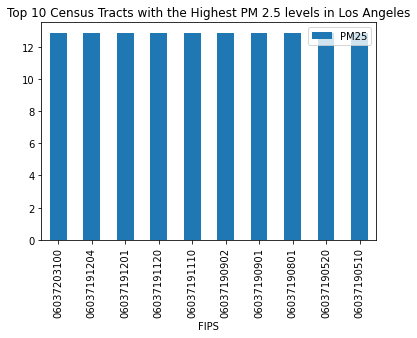

In [19]:
# bar graph on the top 10 Census Tracts with the highest PM 2.5 levels
PM25sorted.head(10).plot.bar(x='FIPS',
                              y='PM25',
                              title='Top 10 Census Tracts with the Highest PM 2.5 levels in Los Angeles')

In [20]:
# here we will create bar graphs on the census tracts with the lowest PM 2.5 levels 
PM25sorted2 = PM25.sort_values(by='PM25',ascending = True)
PM25sorted2[['FIPS','PM25']].head(10)

,FIPS,PM25
994,06037930200,8.697944
283,06037134424,9.955483
95,06037113235,9.955483
71,06037113237,9.955483
1004,06037980023,9.955483
88,06037113211,9.955483
993,06037920303,9.955483
91,06037113231,9.955483
104,06037115103,10.370000
105,06037115104,10.370000


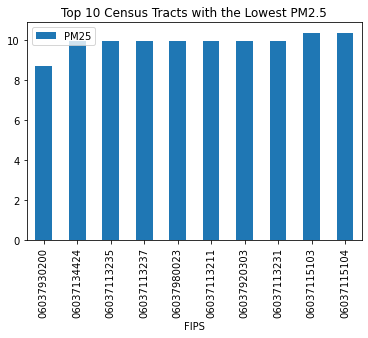

In [21]:
# bar graph on the top 10 neighborhoods with the lowest PM 2.5 levels
PM25sorted2.head(10).plot.bar(x='FIPS',
                        y='PM25',
                        title='Top 10 Census Tracts with the Lowest PM2.5')

In [22]:
# now we will look at PM 2.5 levels by neighborhood
# to do so, we will summarize data by neighorhood
pm25_by_neighborhoods = PM25.groupby('Neighborhood', as_index=False)['PM25'].mean().sort_values(by='PM25',ascending=False)
pm25_by_neighborhoods.head(20)

,Neighborhood,PM25
0,Adams-Normandie,12.89
125,Windsor Square,12.89
51,Historic South-Central,12.89
48,Harvard Heights,12.89
61,Larchmont,12.89
63,Lincoln Heights,12.89
65,Los Feliz,12.89
34,Exposition Park,12.89
31,Elysian Park,12.89
29,Echo Park,12.89


(0.0, 15.0)

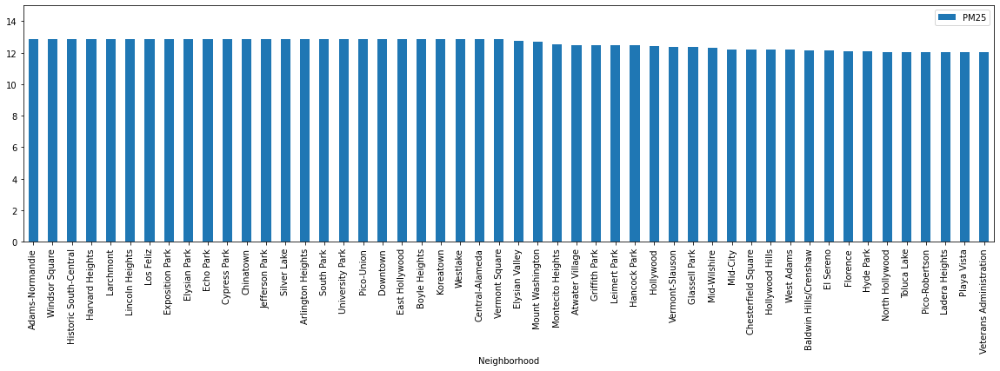

In [23]:
# since the top 20 or so have the same value, we will show more neighborhoods to see the values starts to drop
#this is important to see because we want to know which areas have the most PM 2.5 levels
ax = pm25_by_neighborhoods[:50].plot.bar(figsize=(20,5),x='Neighborhood',y='PM25')
ax.set_ylim([0,15])

# we see that from Adams-Normandie to Vermont Square, these neighborhoods have a PM 2.5 level of about 12.89 μg/m³
# these levels begin to see a slight decline in PM 2.5 levels starting from Elysian Valley and on, however, PM 2.5 levels are still high 

(0.0, 15.0)

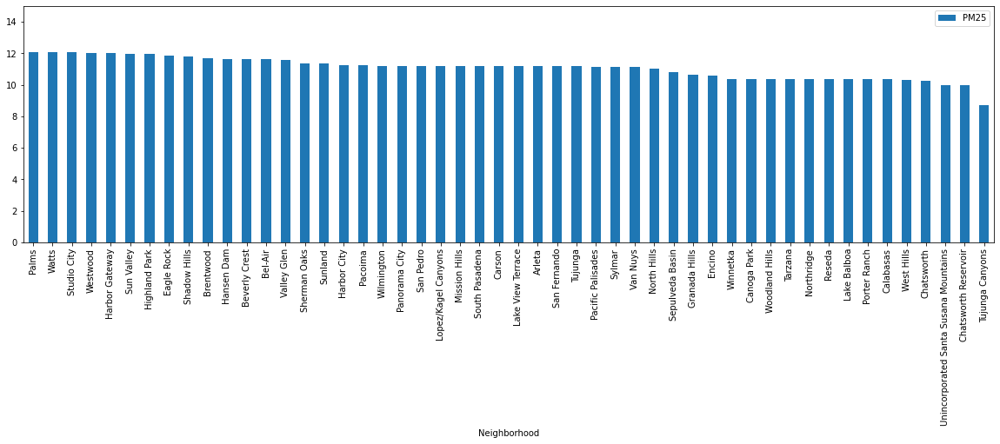

In [24]:
# bottom 50 neighborhoods (neighborhoods with the lowest PM 2.5)
#this is important to see because we want to know which areas have the least PM 2.5 levels
ax = pm25_by_neighborhoods[-50:].plot.bar(figsize=(20,5),x='Neighborhood',y='PM25')
ax.set_ylim([0,15])

# we see that from Palms to Highland Park, these neighborhoods have a PM 2.5 level of about 12 μg/m³ which is still pretty high 
# these levels begin to decline a bit more starting from Sepulveda Basin and on
# we can see here that Tujunga Canyons have the lowest PM 2.5 levels, about 8.69 μg/m³

#  Mapping for PM data

In [25]:
# importing the geopandas library 
import geopandas as gpd

In [26]:
#now that our data is merged, we will add a geomtry track to it so we can create a map 
# get neighborhood boundaries from the LA Times
neighborhoods = gpd.read_file('http://s3-us-west-2.amazonaws.com/boundaries.latimes.com/archive/1.0/boundary-set/la-county-neighborhoods-v3.geojson')

In [27]:
#since we only need FIPS and geometry, we will trim and rename our neighborhoods data
neighborhoods = neighborhoods[['name','geometry']]
neighborhoods.columns = ['Neighborhood','geometry']
neighborhoods.head()

,Neighborhood,geometry
0,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004..."
1,Arleta,"MULTIPOLYGON (((-118.42592 34.22170, -118.4278..."
2,Arlington Heights,"MULTIPOLYGON (((-118.31591 34.05261, -118.3134..."
3,Atwater Village,"MULTIPOLYGON (((-118.27700 34.15325, -118.2756..."
4,Baldwin Hills/Crenshaw,"MULTIPOLYGON (((-118.35626 34.02484, -118.3550..."


In [28]:
# now that both CES and census tracts are ready, we will merge them and match them using the 'Neighborhood' column/code in each database
# calling the merged dataset 'PM25'
PM25_final = neighborhoods.merge(PM25,on="Neighborhood")
PM25_final = PM25_final[['Neighborhood','geometry','GEOID','CensusTract','FIPS','Location','Total_Pop','Longitude','Latitude','PM25']]
PM25_final.head()

,Neighborhood,geometry,GEOID,CensusTract,FIPS,Location,Total_Pop,Longitude,Latitude,PM25
0,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004...",1400000US06037221500,"Census Tract 2215, Los Angeles County, California",06037221500,"(34.034856, -118.3046185)",3507,-118.304637,34.034846,12.89
1,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004...",1400000US06037221601,"Census Tract 2216.01, Los Angeles County, Cali...",06037221601,"(34.034833, -118.2959055)",3403,-118.295926,34.034817,12.89
2,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004...",1400000US06037221810,"Census Tract 2218.10, Los Angeles County, Cali...",06037221810,"(34.0305765, -118.292359)",2773,-118.292301,34.030657,12.89
3,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004...",1400000US06037222100,"Census Tract 2221, Los Angeles County, California",06037222100,"(34.027317, -118.3024105)",3877,-118.302378,34.027317,12.89
4,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004...",1400000US06037222200,"Census Tract 2222, Los Angeles County, California",06037222200,"(34.0309165, -118.302424)",3965,-118.302416,34.030917,12.89


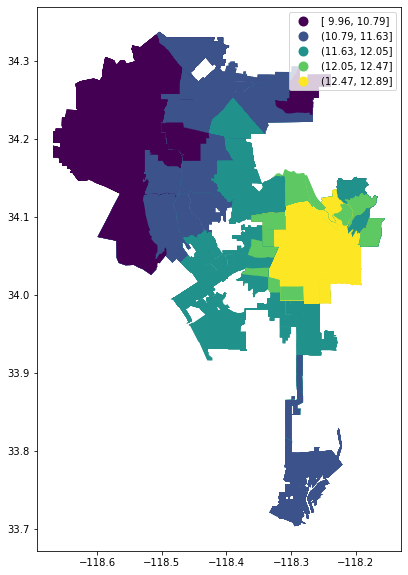

In [29]:
# map on PM 2.5 levels by neighborhood
PM25_final.plot(figsize=(12,10),
                 column='PM25',
                 legend=True, 
                 scheme='NaturalBreaks')

# We see here that the areas with the lowest PM 2.5 levels are located more in the San Fernando Valley and Tujunga
# The areas with the highest PM 2.5 levels are located more towards the Downtown area 

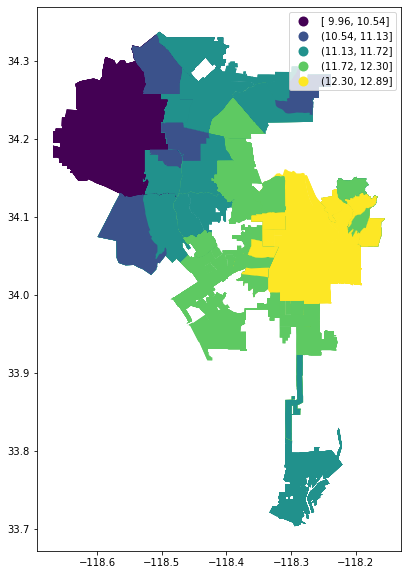

In [30]:
# map on PM 2.5 levels by neighborhood
PM25_final.plot(figsize=(12,10),
                 column='PM25',
                 legend=True, 
                 scheme='equal_interval')

# We see here that the areas with the lowest PM 2.5 levels are located more in the San Fernando Valley 
# The areas with the highest PM 2.5 levels are located more towards the Downtown area 

/opt/conda/lib/python3.8/site-packages/mapclassify/classifiers.py:235: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
/opt/conda/lib/python3.8/site-packages/mapclassify/classifiers.py:238: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)


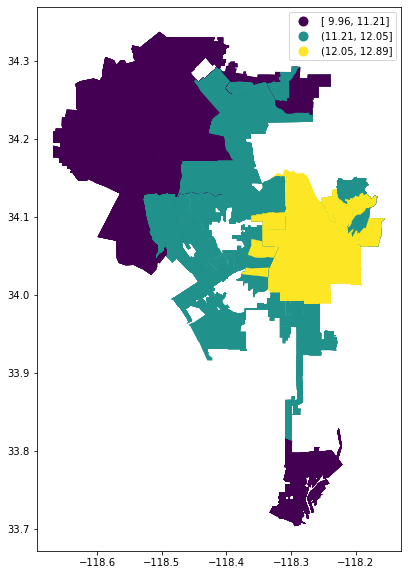

In [31]:
# map on PM 2.5 percentile by neighborhood
PM25_final.plot(figsize=(12,10),
                 column='PM25',
                 legend=True, 
                 scheme='quantiles')

# We see here that the areas with the lowest PM 2.5 levels are located more in the San Fernando Valley, Tujunga, and the Harbor area
# The areas with the highest PM 2.5 levels are located more towards the Downtown area 

Text(0.5, 1.0, 'PM 2.5 Levels by Neighborhood')

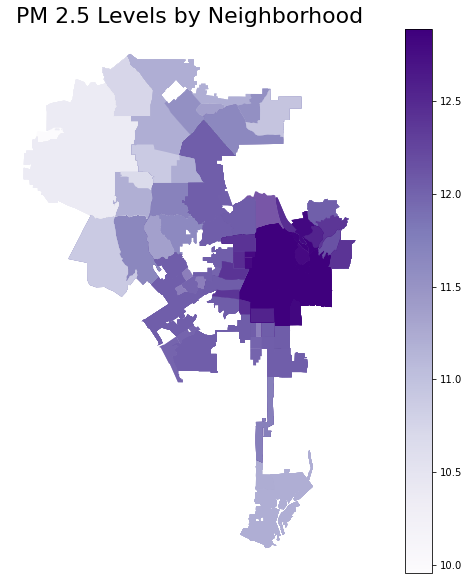

In [32]:
# map on PM 2.5 levels by neighborhood
ax = PM25_final.plot(figsize=(12,10),
                        column='PM25',
                        legend=True,
                        alpha=0.8,
                        cmap='Purples')

ax.axis('off')
ax.set_title('PM 2.5 Levels by Neighborhood',fontsize=22)

# Like the maps above, the areas with the lowest PM 2.5 levels are located more in the San Fernando Valley
# The areas with the highest PM 2.5 levels are located more towards the Downtown area 

In [33]:
# adding contextility to add a basemap to the map above 
import contextily as ctx
#reprojecting web mercator
PM25_final = PM25_final.to_crs(epsg=3857)

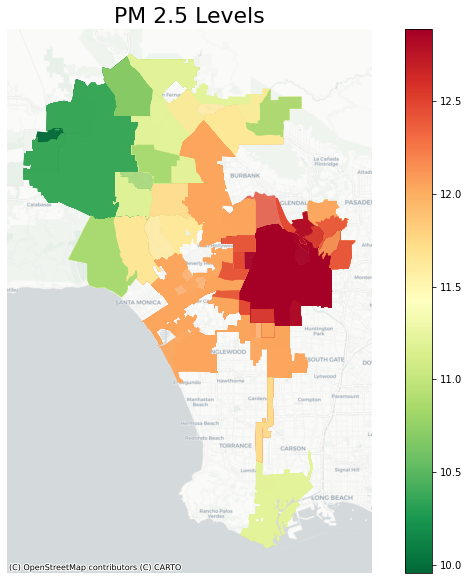

In [34]:
# map on PM 2.5 levels by neighborhood
ax = PM25_final.plot(figsize=(12,10),
                        column='PM25',
                        legend=True,
                        alpha=0.8,
                        cmap='RdYlGn_r')

ax.axis('off')
ax.set_title('PM 2.5 Levels',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [35]:
import plotly.express as px
PM25_final = PM25_final.to_crs(epsg=4326)
PM25_final.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [36]:
minx, miny, maxx, maxy = PM25_final.geometry.total_bounds

In [37]:
center_lat=(maxy-miny)/2+miny
center_lat

34.020486154873765

In [38]:
center_lon=(maxx-minx)/2+minx
center_lon

-118.41180749999987

In [39]:
# interactive of PM2.5 
PM25_map = px.choropleth_mapbox(PM25_final, 
                           geojson=PM25_final.geometry, 
                           locations=PM25_final.index, 
                           color='PM25',
                           color_continuous_scale="Purples",
                           mapbox_style="carto-positron",
                           zoom=9, 
                           center = {"lat": center_lat, "lon": center_lon},
                           hover_name=PM25_final.Neighborhood,
                           opacity=0.5
                          )
PM25_map.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
PM25_map.show()

# save it
PM25_map.write_html("PM25_map.html")

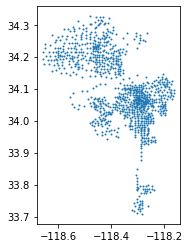

In [40]:
# convert PM25_final to gdf
gdf = gpd.GeoDataFrame(PM25_final, crs="EPSG:4326", geometry=gpd.points_from_xy(PM25_final.Longitude, PM25_final.Latitude))
gdf.plot(markersize=1)

**Healthy Places Index**

The next data set we are working with is the healthy places index (HPI) which measures park access and tree canopy coverage. 

In [41]:
import pandas as pd

In [42]:
HPI = pd.read_csv('Data/HPI_LA.csv')
HPI.head ()

,CensusTract,pop2010,pct2010gq,City,ZIP,County_FIPS,County_Name,UrbanType,hpi2score,hpi2_pctile_pos,...,LEB_pctile,white_pct,black_pct,asian_pct,latino_pct,multiple_pct,NativeAm_pct,PacificIsl_pct,other_pct,version
0,6037101110,4731,1.9,Los Angeles,91042,6037,Los Angeles,urban_area,-0.329010,29.616322,...,25.818042,56.140351,1.564151,10.272670,27.985627,3.022617,0.295921,0.084549,0.634115,Wed13Dec17
1,6037101122,3664,0.0,Los Angeles,91042,6037,Los Angeles,urban_area,0.282758,67.214167,...,72.500962,66.512009,0.709607,13.509825,15.693231,3.165939,0.109170,0.027293,0.272926,Wed13Dec17
2,6037101210,5990,0.9,Los Angeles,91042,6037,Los Angeles,urban_area,-0.359831,27.678686,...,80.764789,48.247078,3.055092,7.479132,37.045075,3.939900,0.100167,0.050083,0.083472,Wed13Dec17
3,6037101220,3363,0.1,Los Angeles,91042,6037,Los Angeles,urban_area,-0.287624,32.234056,...,19.171051,49.420161,1.070473,8.088017,37.823372,3.122212,0.327089,0.059471,0.089206,Wed13Dec17
4,6037101300,4199,1.2,Los Angeles,91042,6037,Los Angeles,urban_area,0.271041,66.444245,...,76.825356,75.970469,0.976423,7.549417,11.979043,3.167421,0.119076,0.071446,0.166706,Wed13Dec17


In [43]:
# we need to get the leading zero back in the FIPS code so we don't run into problems when merging with census tract data

In [44]:
HPI = pd.read_csv(
    'Data/HPI_LA.csv',
    dtype=
    {
        'CensusTract':str,
        'County_FIPS':str,
    }
)

In [45]:
HPI.head()

,CensusTract,pop2010,pct2010gq,City,ZIP,County_FIPS,County_Name,UrbanType,hpi2score,hpi2_pctile_pos,...,LEB_pctile,white_pct,black_pct,asian_pct,latino_pct,multiple_pct,NativeAm_pct,PacificIsl_pct,other_pct,version
0,06037101110,4731,1.9,Los Angeles,91042,06037,Los Angeles,urban_area,-0.329010,29.616322,...,25.818042,56.140351,1.564151,10.272670,27.985627,3.022617,0.295921,0.084549,0.634115,Wed13Dec17
1,06037101122,3664,0.0,Los Angeles,91042,06037,Los Angeles,urban_area,0.282758,67.214167,...,72.500962,66.512009,0.709607,13.509825,15.693231,3.165939,0.109170,0.027293,0.272926,Wed13Dec17
2,06037101210,5990,0.9,Los Angeles,91042,06037,Los Angeles,urban_area,-0.359831,27.678686,...,80.764789,48.247078,3.055092,7.479132,37.045075,3.939900,0.100167,0.050083,0.083472,Wed13Dec17
3,06037101220,3363,0.1,Los Angeles,91042,06037,Los Angeles,urban_area,-0.287624,32.234056,...,19.171051,49.420161,1.070473,8.088017,37.823372,3.122212,0.327089,0.059471,0.089206,Wed13Dec17
4,06037101300,4199,1.2,Los Angeles,91042,06037,Los Angeles,urban_area,0.271041,66.444245,...,76.825356,75.970469,0.976423,7.549417,11.979043,3.167421,0.119076,0.071446,0.166706,Wed13Dec17


In [46]:
# Leading zero is back, now we'll check that it is the correct data type (object)

In [47]:
HPI.info ()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 986 entries, 0 to 985
Data columns (total 91 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CensusTract              986 non-null    object 
 1   pop2010                  986 non-null    int64  
 2   pct2010gq                986 non-null    float64
 3   City                     982 non-null    object 
 4   ZIP                      986 non-null    int64  
 5   County_FIPS              986 non-null    object 
 6   County_Name              986 non-null    object 
 7   UrbanType                986 non-null    object 
 8   hpi2score                977 non-null    float64
 9   hpi2_pctile_pos          977 non-null    float64
 10  hpi2_pctile_neg          977 non-null    float64
 11  hpi_top25pct             977 non-null    object 
 12  quintiles                977 non-null    float64
 13  quartiles                977 non-null    float64
 14  economic                 9

# Data cleaning

In [49]:
HPI.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 986 entries, 0 to 985
Data columns (total 91 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CensusTract              986 non-null    object 
 1   pop2010                  986 non-null    int64  
 2   pct2010gq                986 non-null    float64
 3   City                     982 non-null    object 
 4   ZIP                      986 non-null    int64  
 5   County_FIPS              986 non-null    object 
 6   County_Name              986 non-null    object 
 7   UrbanType                986 non-null    object 
 8   hpi2score                977 non-null    float64
 9   hpi2_pctile_pos          977 non-null    float64
 10  hpi2_pctile_neg          977 non-null    float64
 11  hpi_top25pct             977 non-null    object 
 12  quintiles                977 non-null    float64
 13  quartiles                977 non-null    float64
 14  economic                 9

The only columns we are interested in right now are "cenus tract", "County_FIPS", "parkaccess", "parkaccess_pctile", "treecanopy", and "treecanopy_pctile". So lets trim our data and drop the rest of the columns.

In [51]:
desired_columns = ['CensusTract','parkaccess','parkaccess_pctile', 'treecanopy', 'treecanopy_pctile']
HPI [desired_columns]
HPI_trimmed = HPI [desired_columns]
HPI_trimmed

,CensusTract,parkaccess,parkaccess_pctile,treecanopy,treecanopy_pctile
0,06037101110,97.42126,57.372001,5.855637,57.513153
1,06037101122,100.00000,81.355062,9.199068,77.005004
2,06037101210,100.00000,81.355062,4.011680,32.606185
3,06037101220,88.76004,47.055049,4.652362,44.116515
4,06037101300,90.73589,49.133838,7.477775,69.023483
...,...,...,...,...,...
981,06037297300,100.00000,81.355062,5.518442,54.343642
982,06037297400,100.00000,81.355062,4.324426,38.457590
983,06037297500,100.00000,81.355062,6.016735,59.091492
984,06037297601,100.00000,81.355062,6.514749,63.107917


In [52]:
# Lets rename our columns so they're a little more user friendly

In [53]:
columns = list(HPI_trimmed)
columns

['CensusTract',
 'parkaccess',
 'parkaccess_pctile',
 'treecanopy',
 'treecanopy_pctile']

In [54]:
HPI_trimmed.columns = ['FIPS',
 'Park_Access',
 'Park_Access_Percentile',
 'Tree_Canopy',
 'Tree_Canopy_Percentile']

In [57]:
HPI_trimmed.head ()

,FIPS,Park_Access,Park_Access_Percentile,Tree_Canopy,Tree_Canopy_Percentile
0,06037101110,97.42126,57.372001,5.855637,57.513153
1,06037101122,100.00000,81.355062,9.199068,77.005004
2,06037101210,100.00000,81.355062,4.011680,32.606185
3,06037101220,88.76004,47.055049,4.652362,44.116515
4,06037101300,90.73589,49.133838,7.477775,69.023483


Now that our data is cleaned up we want to start visualization to see where our park access and tree canopy coverage are located in the city. We'll start by looking at tree canopy which as defined by the HPI: "This indicator measures the percentage of land with tree canopy (weighted by number of people per acre)" 

# Graph visualization of Tree Canopy 

In [58]:
HPI_trimmed = HPI_trimmed.sort_values(by='Tree_Canopy',ascending = False)

In [59]:
HPI_trimmed[['FIPS','Tree_Canopy']].head(10)

,FIPS,Tree_Canopy
825,06037261200,20.652590
338,06037141600,20.210195
823,06037261101,19.883298
337,06037141500,19.569714
336,06037141400,19.486557
324,06037139701,19.125964
826,06037262100,19.086587
830,06037262303,18.941309
822,06037243100,18.882921
347,06037143604,18.562241


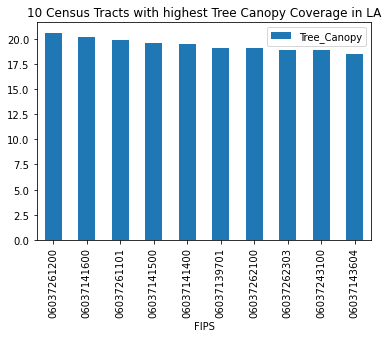

In [60]:
HPI_trimmed.sort_values('Tree_Canopy',ascending=False).head(10).plot.bar(x='FIPS',
                            y='Tree_Canopy',
                           title='10 Census Tracts with highest Tree Canopy Coverage in LA')

These 10 census tracts are: 
1. Historic south central 
2. Boyle heights 
3. Koreatown
4. Downtown 
5. Westlake 
6. Westlake
7. South Park 
8. Downtown 
9. Palms
10. University Park 

In [61]:
HPI_trimmed = HPI_trimmed.sort_values(by='Tree_Canopy',ascending = True)

In [62]:
HPI_trimmed[['FIPS','Tree_Canopy']].head(10)

,FIPS,Tree_Canopy
700,06037226001,1.602414
533,06037206050,1.764766
600,06037212303,1.799636
691,06037224010,2.162962
567,06037209401,2.213683
558,06037208802,2.289196
724,06037229420,2.343863
539,06037207301,2.400490
879,06037269904,2.432109
697,06037224420,2.570740


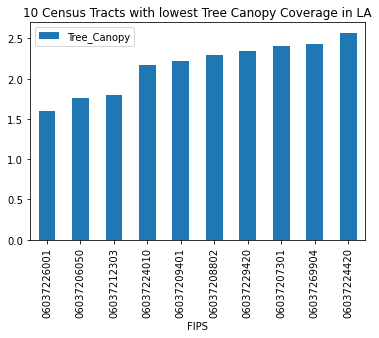

In [63]:
HPI_trimmed.head(10).plot.bar(x='FIPS',
                            y='Tree_Canopy',
                           title='10 Census Tracts with lowest Tree Canopy Coverage in LA')

These 10 census tracts are: 
1. Beverly Crest 
2. Sherman Oaks
3. Beverly Hills
4. Encino 
5. Encino 
6. Encino
7. Beverly Crest 
8. Brentwood 
9. Watts
10. Studio City

Next we'll look at park access which according to HPI "This indicator measures the percentage of the population living within a half-mile of a park, beach, or open space that is larger than 1 acre. A half mile is an approximately 10-minute walk for many people." Park access is tricky because there are a lot of census tracts that have 100% park access and a lot of census tracts that have 0% park access so creating charts for the two extremes won't be that interesting, but a map may be.

For our final project we plan to bring in race/ ethnicity and economic data from the healthy places index as we look into racial and socioeconomic aspects of green space and tree canopy coverage disparity.

# Mapping

In [67]:
import geopandas as gpd

In [68]:
#we'll bring in census tracts from LA county
lacounty=gpd.read_file('Data/la_tracts-Copy1.geojson')
lacounty.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,Census Tract (2012),06037101110,06037101110,06037101110-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2594737', 'NAME': '1011.10',...",/1.0/boundary/06037101110-census-tract-2012/,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,Census Tract (2012),06037101122,06037101122,06037101122-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2677213', 'NAME': '1011.22',...",/1.0/boundary/06037101122-census-tract-2012/,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,Census Tract (2012),06037101210,06037101210,06037101210-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2529724', 'NAME': '1012.10',...",/1.0/boundary/06037101210-census-tract-2012/,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,Census Tract (2012),06037101220,06037101220,06037101220-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2516085', 'NAME': '1012.20',...",/1.0/boundary/06037101220-census-tract-2012/,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,Census Tract (2012),06037101300,06037101300,06037101300-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2487732', 'NAME': '1013', 'I...",/1.0/boundary/06037101300-census-tract-2012/,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [69]:
lacounty.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   kind          2346 non-null   object  
 1   external_id   2346 non-null   object  
 2   name          2346 non-null   object  
 3   slug          2346 non-null   object  
 4   set           2346 non-null   object  
 5   metadata      2346 non-null   object  
 6   resource_uri  2346 non-null   object  
 7   geometry      2346 non-null   geometry
dtypes: geometry(1), object(7)
memory usage: 146.8+ KB


In [70]:
lacounty = lacounty[['name','geometry']]
lacounty.head()

,name,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [71]:
lacounty.columns = ['FIPS','geometry']
lacounty.head()

,FIPS,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


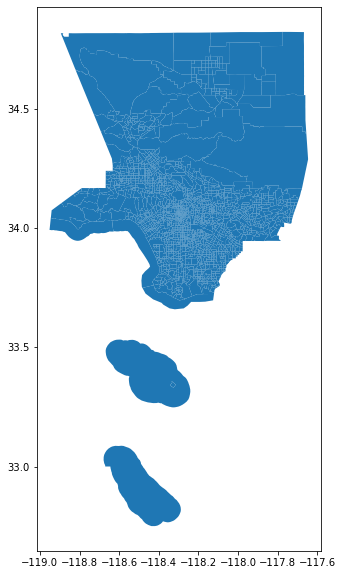

In [72]:
lacounty.plot(figsize=(12,10))

In order to visualize the HPI data we need to merge the 'HPI_trimmed' with the 'lacounty' data by matching the FIPS code/column we will call this new merged dataset 'LA'

In [73]:
LA = lacounty.merge(HPI_trimmed,on='FIPS')

In [74]:
LA.head ()

,FIPS,geometry,Park_Access,Park_Access_Percentile,Tree_Canopy,Tree_Canopy_Percentile
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",97.42126,57.372001,5.855637,57.513153
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031...",100.00000,81.355062,9.199068,77.005004
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859...",100.00000,81.355062,4.011680,32.606185
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859...",88.76004,47.055049,4.652362,44.116515
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719...",90.73589,49.133838,7.477775,69.023483


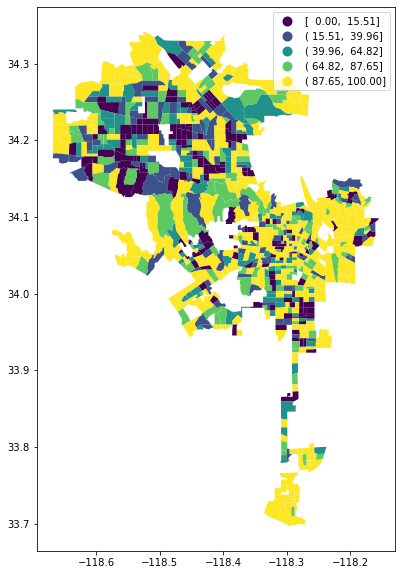

In [76]:
LA.plot(figsize=(12,10),
                 column='Park_Access',
                 legend=True, 
                 scheme='natural_breaks')

Map 1: Park Access in city of LA

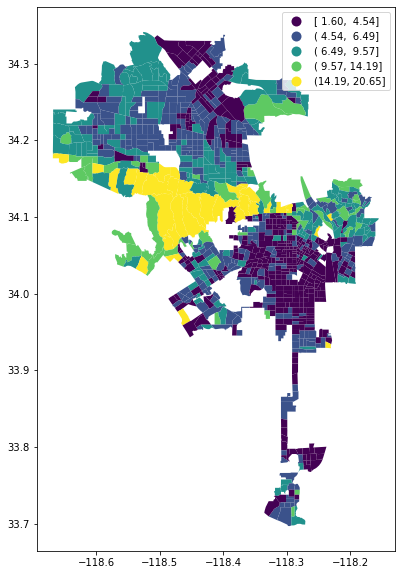

In [79]:
LA.plot(figsize=(12,10),
                 column='Tree_Canopy',
                 legend=True, 
                 scheme='natural_breaks')

Map 2: Tree Canopy coverage in city of LA

**Now we want a map overlway where we can visualze specific data points on a map of Los Angeles**

In [80]:
import geopandas as gpd

In [81]:
neighborhoods = gpd.read_file('http://s3-us-west-2.amazonaws.com/boundaries.latimes.com/archive/1.0/boundary-set/la-county-neighborhoods-v5.geojson')

In [82]:
neighborhoods = neighborhoods[['name','geometry']]
neighborhoods.head ()

,name,geometry
0,Acton,"MULTIPOLYGON (((-118.20262 34.53899, -118.1894..."
1,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004..."
2,Agoura Hills,"MULTIPOLYGON (((-118.76193 34.16820, -118.7263..."
3,Agua Dulce,"MULTIPOLYGON (((-118.25468 34.55830, -118.2555..."
4,Alhambra,"MULTIPOLYGON (((-118.12175 34.10504, -118.1168..."


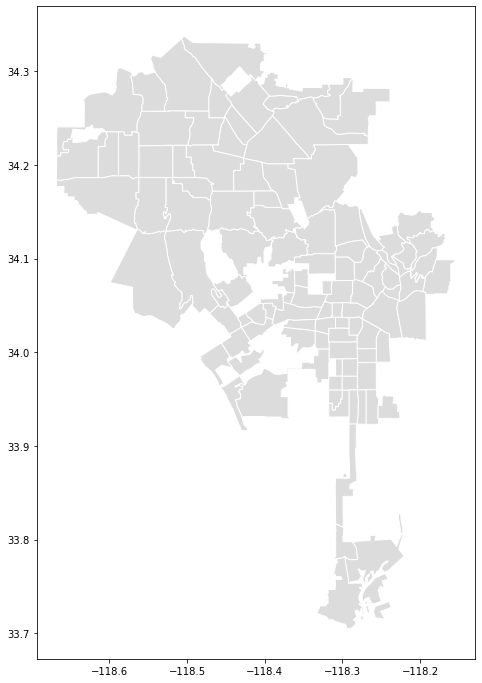

In [112]:
ax=neighborhoods.plot(figsize=(12,12),color='gainsboro', edgecolor='white')

In [84]:
import pandas as pd
import plotly.express as px
from sodapy import Socrata

now we'll bring in the data points from the City of LA website 

In [85]:
client = Socrata("data.lacity.org", None)

results = client.get("ax8j-dhzm", 
                     limit=5000,)

df = pd.DataFrame.from_records(results)

df.head()

,locationtype,location_name,stnumber,stname,stsuffix,city,state,zip,website,phone,...,:@computed_region_tatf_ua23,:@computed_region_2dna_qi2s,stdirection,addresstype,addresstypevalue,:@computed_region_ur2y_g4cx,crossstname,stnumberfraction,crossstsuffix,stsuffixdirection
0,Beaches,Venice Beach,1800,Ocean Front,Walk,"{'latitude': '33.985', 'longitude': '-118.474'...",CA,90291,http://www.laparks.org/dos/reccenter/facility/...,(310) 399-2775,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Beaches,Cabrillo Beach,3720,Stephen M. White,Dr,"{'latitude': '33.7112', 'longitude': '-118.283...",CA,90731,http://www.laparks.org/dos/aquatic/facility/ca...,(310) 548-7554,...,793,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Camps,Griffith Park Boys Camp,4730,Crystal Springs,Dr,"{'latitude': '34.139', 'longitude': '-118.298'...",CA,90027,http://www.laparks.org/dos/camps/griffith.htm,(323) 664-0571,...,1325,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Camps,Otis Wallace Children's Campground,11770,Foothill,Blvd,"{'latitude': '34.2657', 'longitude': '-118.396...",CA,91342,NaN,(818) 756-8060,...,248,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Camps,Griffith Park - Hollywoodland Girls Camp,3200,Canyon,Dr,"{'latitude': '34.1255', 'longitude': '-118.314...",CA,90068,http://www.laparks.org/dos/camps/hollywoodland...,(323) 467-7193,...,543,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [86]:
#We want to check and make sure we have latitude and longitude columns in our data 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df.head ()

,locationtype,location_name,stnumber,stname,stsuffix,city,state,zip,website,phone,councildistrict,geolat,geolong,:@computed_region_qz3q_ghft,:@computed_region_kqwf_mjcx,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_2dna_qi2s,stdirection,addresstype,addresstypevalue,:@computed_region_ur2y_g4cx,crossstname,stnumberfraction,crossstsuffix,stsuffixdirection
0,Beaches,Venice Beach,1800,Ocean Front,Walk,"{'latitude': '33.985', 'longitude': '-118.474'...",CA,90291,http://www.laparks.org/dos/reccenter/facility/...,(310) 399-2775,11,33.985013,-118.474064,25073,10,909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Beaches,Cabrillo Beach,3720,Stephen M. White,Dr,"{'latitude': '33.7112', 'longitude': '-118.283...",CA,90731,http://www.laparks.org/dos/aquatic/facility/ca...,(310) 548-7554,15,33.711229,-118.283406,3342,NaN,2342,793,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Camps,Griffith Park Boys Camp,4730,Crystal Springs,Dr,"{'latitude': '34.139', 'longitude': '-118.298'...",CA,90027,http://www.laparks.org/dos/camps/griffith.htm,(323) 664-0571,4,34.139017,-118.298335,23445,7,2326,1325,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Camps,Otis Wallace Children's Campground,11770,Foothill,Blvd,"{'latitude': '34.2657', 'longitude': '-118.396...",CA,91342,NaN,(818) 756-8060,7,34.26571,-118.3955,18912,1,2334,248,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Camps,Griffith Park - Hollywoodland Girls Camp,3200,Canyon,Dr,"{'latitude': '34.1255', 'longitude': '-118.314...",CA,90068,http://www.laparks.org/dos/camps/hollywoodland...,(323) 467-7193,4,34.125465,-118.314396,24033,7,2326,543,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
list(df)

['locationtype',
 'location_name',
 'stnumber',
 'stname',
 'stsuffix',
 'city',
 'state',
 'zip',
 'website',
 'phone',
 'councildistrict',
 'geolat',
 'geolong',
 ':@computed_region_qz3q_ghft',
 ':@computed_region_kqwf_mjcx',
 ':@computed_region_k96s_3jcv',
 ':@computed_region_tatf_ua23',
 ':@computed_region_2dna_qi2s',
 'stdirection',
 'addresstype',
 'addresstypevalue',
 ':@computed_region_ur2y_g4cx',
 'crossstname',
 'stnumberfraction',
 'crossstsuffix',
 'stsuffixdirection']

This data has an error in one of the longitude cells where the number is a positive value. This was resulting in a collapsed map that was not showing any data points. We need to locate and change that value now

In [154]:
df.geolong = df.geolong.astype('float')
df.geolat = df.geolat.astype('float')
df.geolong.describe()

count    986.000000
mean    -118.349302
std        0.120760
min     -118.668691
25%     -118.439294
50%     -118.314186
75%     -118.264784
max     -117.302884
Name: geolong, dtype: float64

In [155]:
df.geolong[df.geolong>0]

Series([], Name: geolong, dtype: float64)

This is the record with the positive longitude value so we'll change that now

In [159]:
df.loc[250].geolong
df.at[250,'geolong'] = -df.loc[250].geolong

In [160]:
parks = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.geolong, df.geolat))

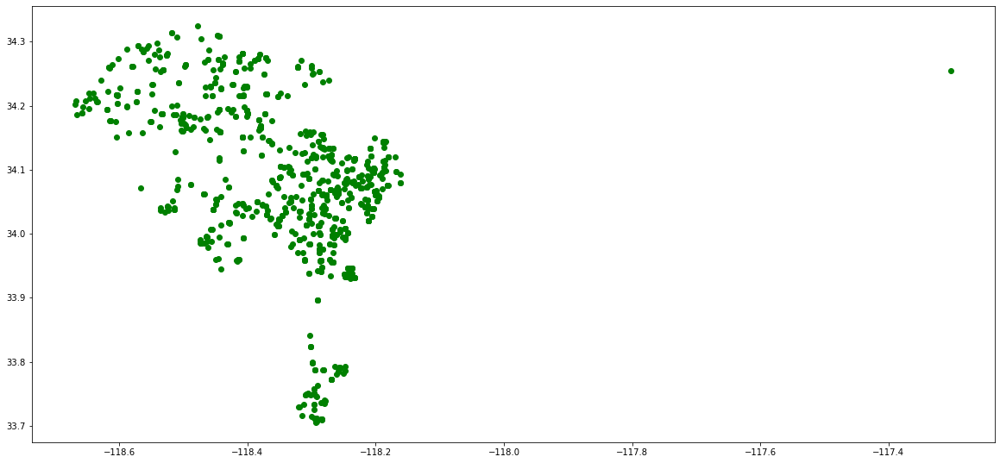

In [161]:
parks.plot(figsize=(20,20),color='green')

Now that we have our base map and datapoints for parks in LA, we want to combine them

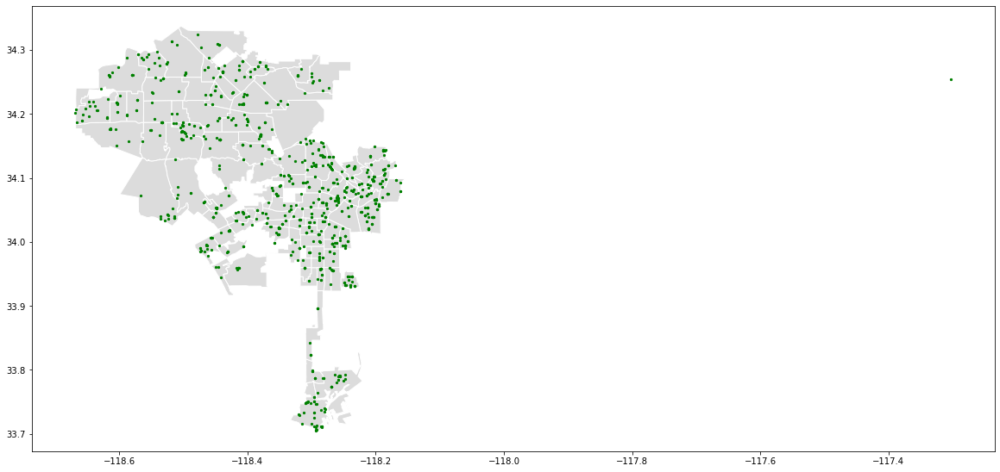

In [166]:
base = neighborhoods.plot(figsize=(20,20),color='gainsboro', edgecolor='white')
ax = parks.plot(ax=base, color='green', markersize=5)

TypeError: __init__() got an unexpected keyword argument 'loc'

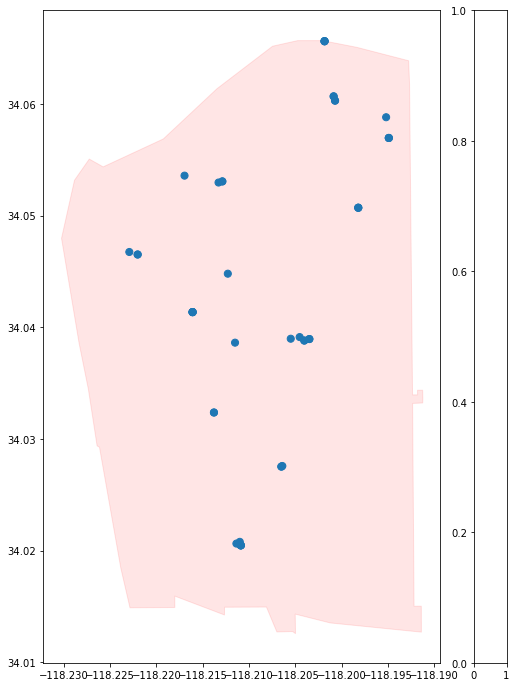

In [147]:
neighborhood = neighborhoods[neighborhoods.name=='Boyle Heights']

minx, miny, maxx, maxy = neighborhood.geometry.total_bounds


parks_in_neighborhood = gpd.sjoin(parks,neighborhood,how='inner')


base = neighborhood.plot(figsize=(12,12),
                         color='red', 
                         edgecolor='red',
                         alpha=0.1)

ax = parks_in_neighborhood.plot(ax=base, 
                                column='park_count', 
                                markersize=50, 
                                legend=True,
                                cmap='tab20',
                            legend_kwds={
                                   'loc': 'upper right',
                                   'bbox_to_anchor':(1.3,1)
                                }                  
                            )

ax.set_xlim(minx - 200, maxx + 200)
ax.set_ylim(miny - 200, maxy + 200)

ax.axis('off')

ax.set_title('Park Count in '+neighborhood.name.values[0]+' Los Angeles',fontsize=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax

In [131]:
def park_counts_by_neighborhood(place='Boyle Heights'):
    
    neighborhood = neighborhoods[neighborhoods.name==place]

    minx, miny, maxx, maxy = neighborhood.geometry.total_bounds

    parks_in_neighborhood = gpd.sjoin(parks,neighborhood,how='inner')

    base = neighborhood.plot(figsize=(12,12),
                             color='red', 
                             edgecolor='red',
                             alpha=0.1)

    ax = parks_in_neighborhood.plot(ax=base, 
                                    column='park_count', 
                                    markersize=40, 
                                    legend=True,
                                    cmap='tab20',
                                    legend_kwds={
                                       'loc': 'upper right',
                                       'bbox_to_anchor':(1.3,1)
                                    }                  
                                )


    ax.set_xlim(minx - 200, maxx + 200) 
    ax.set_ylim(miny - 200, maxy + 200)

    ax.axis('off')

    ax.set_title('Park Count in '+neighborhood.name.values[0]+' Los Angeles',fontsize=20)

    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
    ax

TypeError: __init__() got an unexpected keyword argument 'loc'

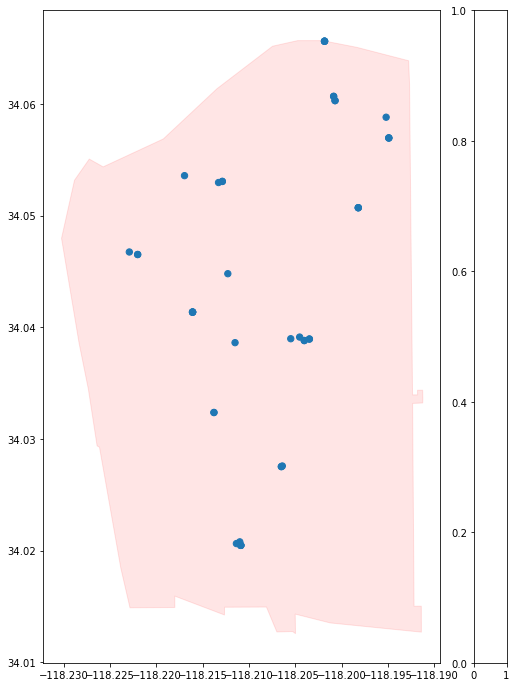

In [134]:
park_counts_by_neighborhood(place='Boyle Heights')

TypeError: __init__() got an unexpected keyword argument 'loc'

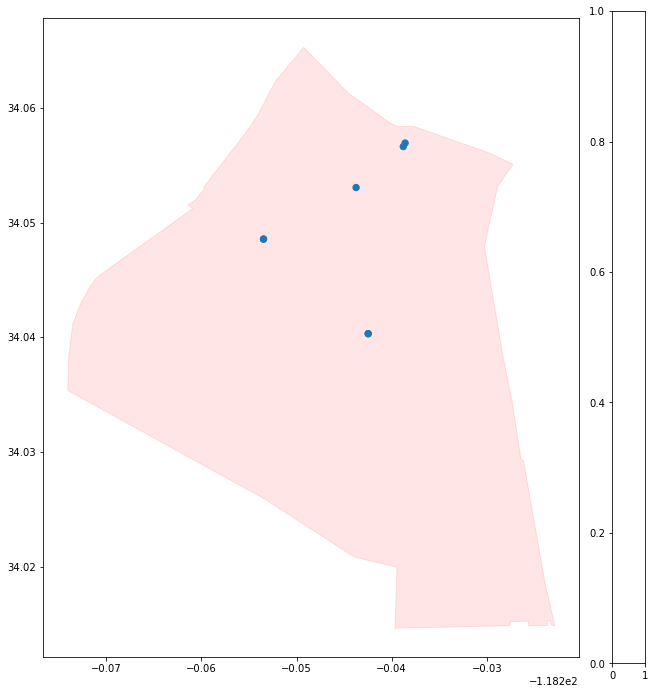

In [144]:
park_counts_by_neighborhood(place='Downtown')

Now we can see the array of parks but we want to focus again on which neighborhoods have more parks than others. 

In [99]:
parks.set_crs(epsg=4326, inplace=True)
parks.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [100]:
neighborhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [101]:
join = gpd.sjoin(neighborhoods,
                 parks,
                 how='right')

In [102]:
join.head ()

,index_left,name,locationtype,location_name,stnumber,stname,stsuffix,city,state,zip,website,phone,councildistrict,geolat,geolong,:@computed_region_qz3q_ghft,:@computed_region_kqwf_mjcx,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_2dna_qi2s,stdirection,addresstype,addresstypevalue,:@computed_region_ur2y_g4cx,crossstname,stnumberfraction,crossstsuffix,stsuffixdirection,geometry
384,1.0,Adams-Normandie,Parks,Elinor and Don Richardson Family Park,2700,Budlong,Ave,"{'latitude': '34.0301', 'longitude': '-118.296...",CA,90007,http://www.laparks.org/dos/parks/facility/rich...,(213) 485-5054,8,34.030129,-118.295806,22724,14,689,654,32,S,NaN,NaN,7,NaN,NaN,NaN,NaN,POINT (-118.29581 34.03013)
336,1.0,Adams-Normandie,Parks,Loren Miller Park,2717,Halldale,Ave,"{'latitude': '34.0303', 'longitude': '-118.303...",CA,90018,http://www.laparks.org/dos/reccenter/facility/...,(323) 734-1302,8,34.030261,-118.303031,23079,14,689,654,32,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,POINT (-118.30303 34.03026)
691,1.0,Adams-Normandie,Recreation Centers,Loren Miller Recreation Center,2717,Halldale,Ave,"{'latitude': '34.0303', 'longitude': '-118.303...",CA,90018,http://www.laparks.org/dos/reccenter/facility/...,(323) 734-1302,8,34.030261,-118.303031,23079,14,689,654,32,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,POINT (-118.30303 34.03026)
594,1.0,Adams-Normandie,Public Computer Centers,Loren Miller Youth Center - Public Computer Ce...,2717,Halldale,Ave,"{'latitude': '34.0303', 'longitude': '-118.303...",CA,90018,http://www.laparks.org/btop/lynda.htm,(323) 734-1302,8,34.030261,-118.303031,23079,14,689,654,32,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,POINT (-118.30303 34.03026)
898,1.0,Adams-Normandie,Tennis Courts,Loren Miller Tennis Courts,2717,Halldale,Ave,"{'latitude': '34.0305', 'longitude': '-118.304...",CA,90018,http://www.laparks.org/dos/reccenter/facility/...,(323) 734-1302,8,34.030545,-118.303731,23079,14,689,654,32,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,POINT (-118.30373 34.03054)


In [103]:
parks_by_neighborhoods = join.name.value_counts().rename_axis('name').reset_index(name='park_count')

In [104]:
parks_by_neighborhoods.head(10)

,name,park_count
0,Boyle Heights,46
1,San Pedro,36
2,Griffith Park,36
3,North Hollywood,24
4,Pacoima,23
5,Watts,23
6,Venice,21
7,Wilmington,19
8,Baldwin Hills/Crenshaw,19
9,Central-Alameda,19


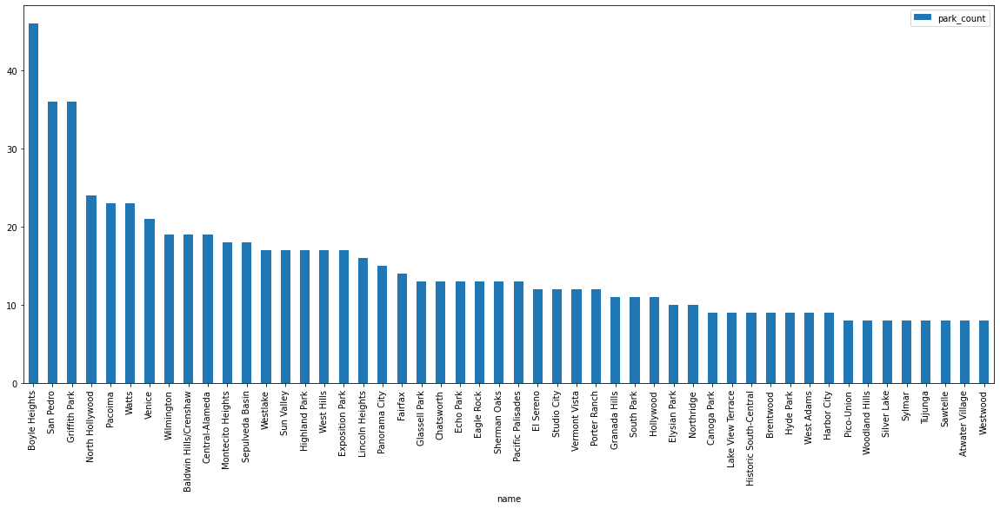

In [105]:
parks_by_neighborhoods[:50].plot.bar(figsize=(20,8),x='name',y='park_count')

This map shows us the park count by neighrbohood with boyle heights on the highest end and westwood on the lowest end. However, we don't have information about the size of these parks which is something we may explore going forward. Because when it comes to green space the physical size may be more impactful than the count of parks

In [106]:
neighborhoods=neighborhoods.merge(parks_by_neighborhoods,on='name')
neighborhoods.head (10)

,name,geometry,park_count
0,Adams-Normandie,"MULTIPOLYGON (((-118.30901 34.03741, -118.3004...",5
1,Arleta,"MULTIPOLYGON (((-118.42202 34.22410, -118.4228...",4
2,Arlington Heights,"MULTIPOLYGON (((-118.31591 34.05261, -118.3134...",2
3,Atwater Village,"MULTIPOLYGON (((-118.27832 34.15301, -118.2770...",8
4,Baldwin Hills/Crenshaw,"MULTIPOLYGON (((-118.35626 34.02484, -118.3550...",19
5,Beverly Crest,"MULTIPOLYGON (((-118.45321 34.13181, -118.4512...",3
6,Beverly Grove,"MULTIPOLYGON (((-118.37249 34.08575, -118.3724...",2
7,Beverlywood,"MULTIPOLYGON (((-118.38961 34.05231, -118.3895...",1
8,Boyle Heights,"MULTIPOLYGON (((-118.19271 34.06181, -118.1923...",46
9,Brentwood,"MULTIPOLYGON (((-118.48842 34.13001, -118.4799...",9


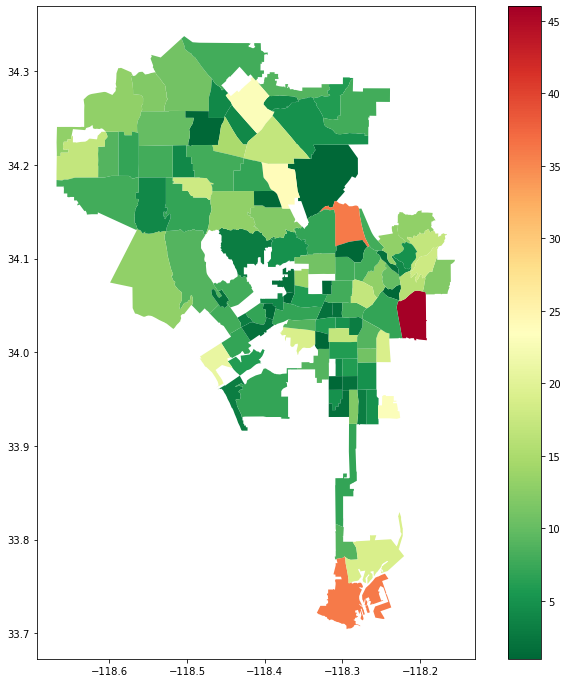

In [107]:
neighborhoods.plot(figsize=(12,12),column='park_count',legend=True,cmap='RdYlGn_r')

In [110]:
# Here we can see boyle heights colored deep red due to its high park count

Now we'll add a title and base map

In [135]:
import contextily as ctx

In [136]:
neighborhoods = neighborhoods.to_crs(epsg=3857)

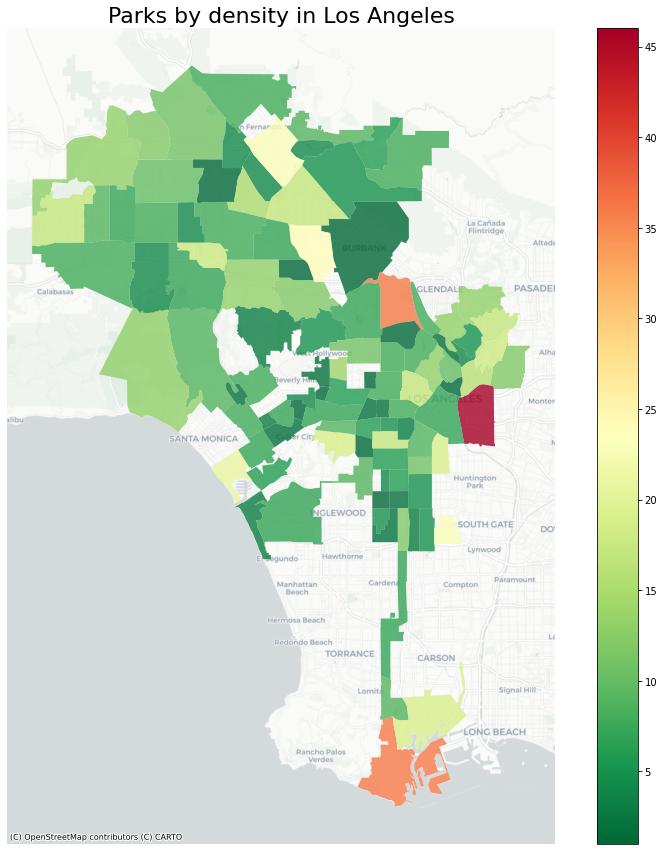

In [137]:
ax = neighborhoods.plot(figsize=(15,15),
                        column='park_count',
                        legend=True,
                        alpha=0.8,
                        cmap='RdYlGn_r')

ax.axis('off')
ax.set_title('Parks by density in Los Angeles',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now we'll make an interactive map

In [138]:
import plotly.express as px

In [139]:
neighborhoods = neighborhoods.to_crs(epsg=4326)
neighborhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [140]:
minx, miny, maxx, maxy = neighborhoods.geometry.total_bounds

In [141]:
center_lat=(maxy-miny)/2+miny
center_lat

34.020922350091055

In [142]:
center_lon=(maxx-minx)/2+minx
center_lon

-118.41173300000008

In [143]:
fig = px.choropleth_mapbox(neighborhoods, 
                           geojson=neighborhoods.geometry, 
                           locations=neighborhoods.index, 
                           color='park_count',
                           color_continuous_scale="rdylgn_r",
                           mapbox_style="carto-positron",
                           zoom=9, 
                           center = {"lat": center_lat, "lon": center_lon},
                           hover_name=neighborhoods.name,
                           opacity=0.5
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

**Group members**: Wendy Miranda and Sasha Ragland 

**Division of labor & contribution**: Wendy was responsible for Cal Enviro screen data. Wendy first cleaned up her section of the notebook involving the Cal Enviro Screen data and then shared it with Sasha to add her data. 
Sasha was in charge of the HPI data that looked at Parks and Tree Canopy as well as the parks data from the City of LA. Sasha cleaned up her section of the notebook and created the function as well. |
